In [2]:
import pandas as pd
%matplotlib inline
df = pd.read_csv('/Users/amitnverma/Desktop/2020-2021-2022/Parsh/ScienceFair/DataSets/unsdg_2002_2021.csv')
# df.head()
# df.describe()
# for col in df.columns:
#     print(col)
list(df.columns)
# df.shape

# Remove Developed Economy
# df.groupby("level_of_development").country.count()
# df_filtered = df[df['level_of_development'] != 'Developed Economies']
# df_filtered.groupby("level_of_development").country.count()


['dt_year',
 'dt_date',
 'country',
 'region',
 'level_of_development',
 'greenhousegas_emissione_mtco2equivalent',
 'total_government_revenue_proportion_of_gdp_perc',
 'fdi_inflows_millionusd',
 'annual_growth_rate_perc',
 'proportion_of_population_with_primary_reliance_on_clean_fuels_a',
 'mortality_rate_perc',
 'renewable_energy_share_on_the_total_energy_consumption',
 'co2emissions_from_fuel_combustion_in_millions_of_tonnes',
 'fossilfuel_subsidies_consumption_and_production_billionusd',
 'randd_expenditure_proportionofgdp_perc',
 'national_action_plans_as_priority_national_policies',
 'number_of_companies_publishing_sustainability_reports',
 'education_for_sustainable_development',
 'enhance_policy_coherence_for_sustainable_development',
 'land_degraded_over_total_land_area']

In [9]:
# pip install pandas-profiling
# conda env create -n pandas-profiling
# conda activate pandas-profiling
# conda install -c conda-forge pandas-profiling
from pandas_profiling import ProfileReport
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [38]:
import numpy as np
pd.pivot_table(df,index='country',columns='level_of_development',values='greenhousegas_emissione_mtco2equivalent',aggfunc=max)

level_of_development,Developed Economies,Developing Economies,Economies in Transition,Least Developed,Not Specified
country,,,,,
Afghanistan,NaN,NaN,NaN,43.37700,NaN
Albania,NaN,NaN,8.12570,NaN,NaN
Angola,NaN,NaN,NaN,61.61076,NaN
Argentina,NaN,338.96335,NaN,NaN,NaN
Armenia,NaN,NaN,7.20217,NaN,NaN
...,...,...,...,...,...
Uruguay,NaN,37.22881,NaN,NaN,NaN
Uzbekistan,NaN,NaN,227.29898,NaN,NaN
Viet Nam,NaN,278.44186,NaN,NaN,NaN


In [39]:
pd.crosstab(df.country,df.level_of_development)

level_of_development,Developed Economies,Developing Economies,Economies in Transition,Least Developed,Not Specified
country,,,,,
Afghanistan,0,0,0,20,0
Albania,0,0,20,0,0
Algeria,0,20,0,0,0
American Samoa,0,0,0,0,20
Andorra,0,0,0,0,20
...,...,...,...,...,...
Yemen,0,0,0,20,0
Yugoslavia [former],0,0,0,0,20
Zambia,0,0,0,20,0


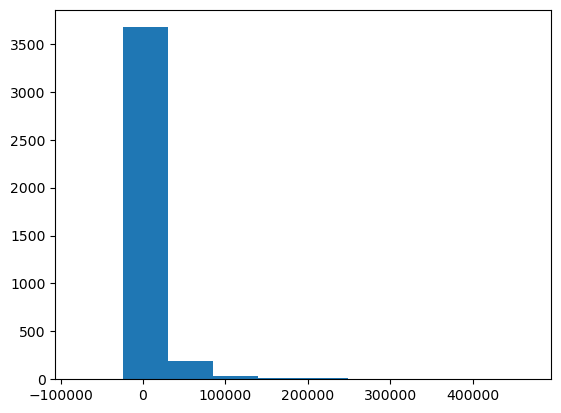

In [41]:
#outlier
import matplotlib.pyplot as plt
plt.hist(df['fdi_inflows_millionusd'])
plt.show()

563.0 ** 23804.87757361783


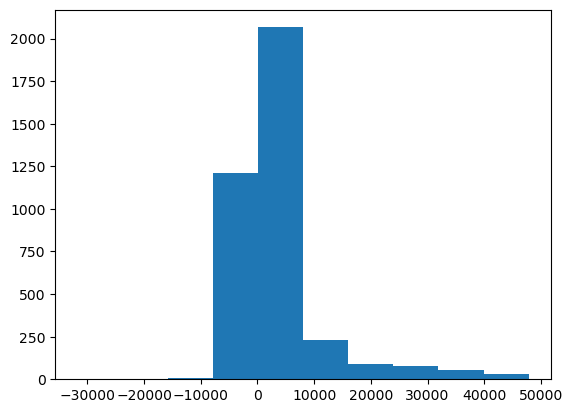

In [67]:
# df['fdi_inflows_millionusd'].mean()
#function to remove outlier which is less than or more than 2 std deviation of the median
import numpy as np
def reject_outliers(data):
    u = np.median(data)
    s = np.std(data)
    print(u,"**",s)
    filtered = [e for e in data if (u - 2 * s < e < u + 2 * s)]
    return filtered

filtered = reject_outliers(df['fdi_inflows_millionusd'].dropna())

plt.hist(filtered)
plt.show()

In [68]:
np.mean(filtered)

3395.974896280794

In [69]:
df.head()

,dt_year,dt_date,country,region,level_of_development,greenhousegas_emissione_mtco2equivalent,total_government_revenue_proportion_of_gdp_perc,fdi_inflows_millionusd,annual_growth_rate_perc,proportion_of_population_with_primary_reliance_on_clean_fuels_a,mortality_rate_perc,renewable_energy_share_on_the_total_energy_consumption,co2emissions_from_fuel_combustion_in_millions_of_tonnes,fossilfuel_subsidies_consumption_and_production_billionusd,randd_expenditure_proportionofgdp_perc,national_action_plans_as_priority_national_policies,number_of_companies_publishing_sustainability_reports,education_for_sustainable_development,enhance_policy_coherence_for_sustainable_development,land_degraded_over_total_land_area
0,2002,2002-01-01,Afghanistan,Central and Southern Asia,Least Developed,NaN,NaN,0.68,0.420344,8.0,NaN,37.83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2003,2003-01-01,Afghanistan,Central and Southern Asia,Least Developed,NaN,0.120955,50.00,0.105249,9.0,NaN,36.66,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2004,2004-01-01,Afghanistan,Central and Southern Asia,Least Developed,NaN,0.176214,57.80,-0.014901,11.0,NaN,44.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2005,2005-01-01,Afghanistan,Central and Southern Asia,Least Developed,19.32802,0.180929,186.90,0.036212,12.0,0.409,33.88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2006,2006-01-01,Afghanistan,Central and Southern Asia,Least Developed,NaN,0.302234,271.00,0.053648,14.0,NaN,31.89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [70]:
df.shape

(5176, 20)

In [4]:
#Check how many values of each column is null
df.isnull().sum()


dt_year                                                               0
dt_date                                                               0
country                                                               0
region                                                                0
level_of_development                                                  0
greenhousegas_emissione_mtco2equivalent                            3984
total_government_revenue_proportion_of_gdp_perc                    2483
fdi_inflows_millionusd                                             1257
annual_growth_rate_perc                                            1166
proportion_of_population_with_primary_reliance_on_clean_fuels_a    1549
mortality_rate_perc                                                4444
renewable_energy_share_on_the_total_energy_consumption             1063
co2emissions_from_fuel_combustion_in_millions_of_tonnes            2579
fossilfuel_subsidies_consumption_and_production_billionusd      

In [7]:
#impute numeric values with given value(It can be mean,Median or mode of the column)
#********There is no perfect way for filling the missing values in a dataset.*************
def imputeNumeric(df,colName,imputeVal):
    updated_df = df
    updated_df[colName]=updated_df[colName].fillna(imputeVal)
    return updated_df
updated_df=imputeNumeric(df,'greenhousegas_emissione_mtco2equivalent',df['greenhousegas_emissione_mtco2equivalent'].mean())
df.isnull().sum() # display all the null/blank values of a column
    

dt_year                                                               0
dt_date                                                               0
country                                                               0
region                                                                0
level_of_development                                                  0
greenhousegas_emissione_mtco2equivalent                               0
total_government_revenue_proportion_of_gdp_perc                    2483
fdi_inflows_millionusd                                             1257
annual_growth_rate_perc                                            1166
proportion_of_population_with_primary_reliance_on_clean_fuels_a    1549
mortality_rate_perc                                                4444
renewable_energy_share_on_the_total_energy_consumption             1063
co2emissions_from_fuel_combustion_in_millions_of_tonnes            2579
fossilfuel_subsidies_consumption_and_production_billionusd      